# 3. Fitting diads once you have groups
- Once you have divided your diads into groups based on strengths, you need to tweak the fit parameters for each group
- Then you can loop through all files in a given group and automatically fit the spectra

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import DiadFit as pf
pf.__version__

'0.0.78'

## Specifying filetype, and folder as before

In [31]:
# This specifies what file type your Raman exported in. 
meta_path, spectra_path, filetype, prefix, prefix_str, file_ext, TruPower=pf.get_settings()

In [32]:
spectra_path

'C:\\Users\\penny\\Box\\Berkeley_new\\DiadFit_outer\\docs\\Examples\\Example1b_CO2_Fluid_Inclusions\\Spectra'

## Load in data and fit parameters
- This loads in the dataframes of the fit parameters you saved in the other file, by group
- At this point you select what group you want to fit (batch = 'Weak', 'Medium' or 'Strong'). After running through the entire notebook for one group, come back up here to fit a second group.

In [33]:
## load dataframes and numpy arrays 
np_x = joblib.load('np_x.sav')

# Select the group you want to fit ('Weak', 'Medium', 'Strong'). After selecting one, go through and select another one and run again from here. 
batch='Weak' # Options are Weak, Medium, Strong

if batch=='Weak':
    GroupN_df=joblib.load('Weak_df.sav')
if batch=='Medium':
    GroupN_df=joblib.load('Medium_df.sav')
if batch=='Strong':
    GroupN_df=joblib.load('Strong_df.sav')

### Now load one file from this group to tweak parameters for

In [34]:
Diad_Files =GroupN_df['filename']
i=0
Diad_Files


0                  02 K23_10_FIA_50X.txt
1                   05 K23_1_FIA_50X.txt
2       06 K23_1_FIA_50X_r2_longeraq.txt
3                   08 K23_2_FIA_50X.txt
4                   09 K23_2_FIB_50X.txt
5       11 K23_2_FIC_50X_CRR_DiadFit.txt
6       13 K23_4_FIA_50X_CRR_DiadFit.txt
7                   14 K23_4_FIB_50X.txt
8                   16 K23_6_FIA_50X.txt
9                   17 K23_7_FIA_50X.txt
10                  19 K23_7_FIB_50X.txt
11      20 K23_7_FIC_50X_CRR_DiadFit.txt
12      21 K23_9_FIA_50X_CRR_DiadFit.txt
13                23 K23_101_FID_50X.txt
14    24 K23_101_FIC_50X_CRR_DiadFit.txt
15        26 K23_102_FIA_CRR_DiadFit.txt
Name: filename, dtype: object

### Lets plot the diad to have a look at it

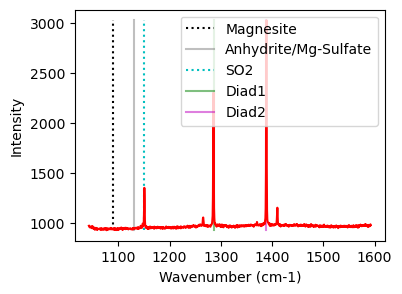

In [35]:
plot1=pf.plot_diad(path=spectra_path, filename=Diad_Files[i], filetype=filetype)

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

## Choose a model for fitting all peaks
- Option of Voigt or PseudoVoigt. We recomend PsuedoVoigt

In [36]:
model_name='VoigtModel'

## Fit Diad 1
- Tweak the parameters in the config files for each group. E.g. how many peaks (fit_peaks), the background positions, the sigma of the diad, and whether or not you want a gaussian background

In [37]:
diad_id_config=pf.diad_id_config(height=50, exclude_range1=[1308, 1309])
diad_id_config

if batch=='Weak':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1250),
    upper_bck_diad1=(1300, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Medium':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1240),
    upper_bck_diad1=(1315, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Strong':
    diad1_fit_config_init=pf.diad1_fit_config(
    fit_gauss=True, gauss_amp= 2*GroupN_df['HB1_abs_prom'].iloc[i],
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
diad1_fit_config_init

diad1_fit_config(model_name='VoigtModel', fit_peaks=2, N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1250), upper_bck_diad1=(1300, 1350), fit_gauss=False, gauss_amp=1000, diad_sigma=0.6, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=1350.4382712685078, HB_prom=103.98477495514248, x_range_baseline=30, y_range_baseline=100, dpi=200, x_range_residual=10, return_other_params=False)

### See what these fit parameters look like for diad1

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_cent_err,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,HB1_Cent,HB1_Area,HB1_Sigma,Diad1_Combofit_Height,Diad1_Residual,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit
0,1285.533817,1285.533867,0.003203,2137.383008,0.328804,0.328804,1265.38371,233.347772,0.530114,1356.807979,6.821308,0,1.184118,Flagged Warnings:


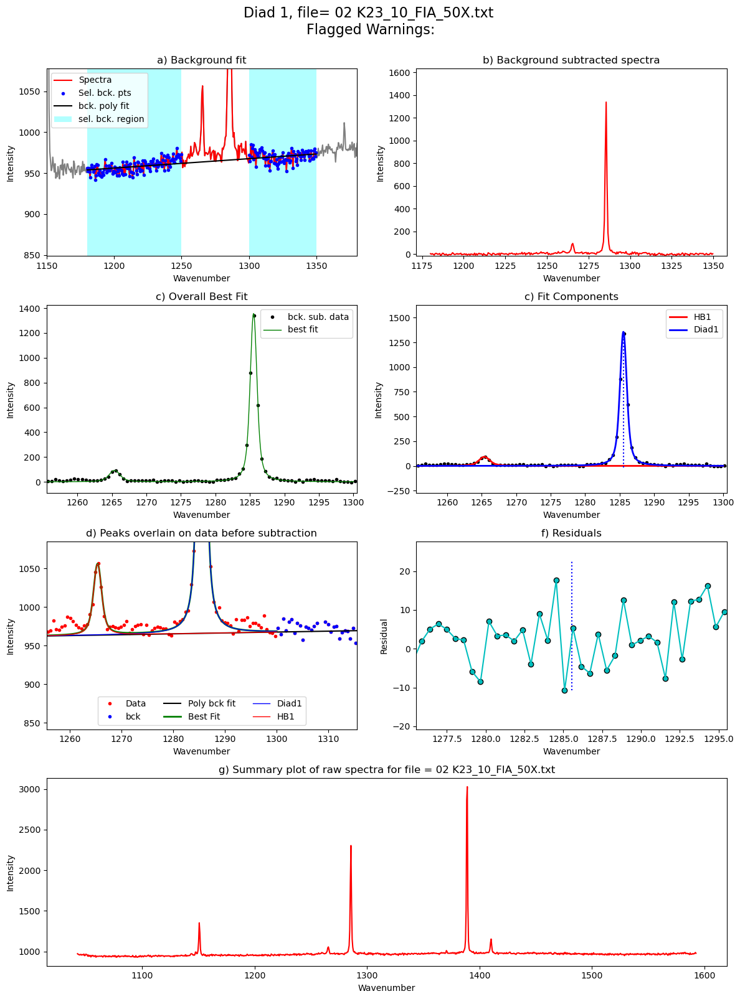

In [38]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config,
path=spectra_path, filename=Diad_Files.iloc[0],
filetype=filetype, plot_figure=True, close_figure=False,
Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
HB_pos=GroupN_df['HB1_pos'].iloc[i])
Diad1_fit

### Update the sigma
- The sigma parameter varies quite a lot based on the splitting. Best to update your first guess with what you found for the example file above

In [39]:
diad1_fit_config2=diad1_fit_config_init

## Fit diad2

In [40]:
if batch=='Weak':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=2, upper_bck_diad2=(1430, 1480),
    lower_bck_diad2=(1310, 1360), diad_sigma=0.4,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Medium':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1350), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Strong':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init
diad2_fit_config_init

diad2_fit_config(model_name='VoigtModel', fit_peaks=2, N_poly_bck_diad2=2, lower_bck_diad2=(1310, 1360), upper_bck_diad2=(1430, 1480), fit_gauss=False, gauss_amp=1000, diad_sigma=0.4, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=2243.7095837782394, HB_prom=178.5174353119412, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=30, return_other_params=False, C13_prom=10)

### See what these fit parameters look like for diad2

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_cent_err,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,HB2_Cent,HB2_Area,HB2_Sigma,Diad2_Combofit_Height,Diad2_Residual,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit
0,1388.851517,1388.851467,0.001431,3220.607695,0.275477,0.275477,1410.165397,308.889774,0.36604,2440.101388,5.44958,0,0.992074,Flagged Warnings:


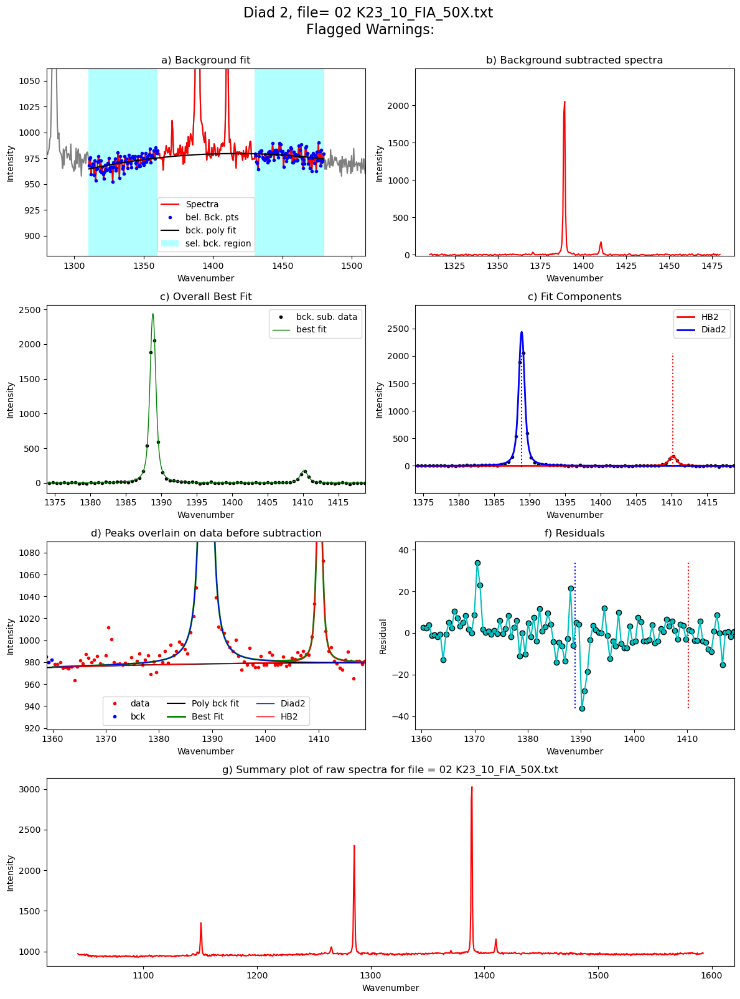

In [41]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config,
path=spectra_path, filename=Diad_Files[i], filetype=filetype,
plot_figure=True, close_figure=False, 
Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
HB_pos=GroupN_df['HB2_pos'].iloc[i], 
C13_pos=GroupN_df['C13_pos'].iloc[i])
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

## Loop over all the files in the group
- This will loop over all the 

  0%|          | 0/16 [00:00<?, ?it/s]

Processing file: 02 K23_10_FIA_50X.txt


  6%|▋         | 1/16 [00:02<00:39,  2.66s/it]

Processing file: 05 K23_1_FIA_50X.txt


 12%|█▎        | 2/16 [00:05<00:37,  2.71s/it]

Processing file: 06 K23_1_FIA_50X_r2_longeraq.txt


 19%|█▉        | 3/16 [00:07<00:33,  2.60s/it]

Processing file: 08 K23_2_FIA_50X.txt


 25%|██▌       | 4/16 [00:10<00:31,  2.62s/it]

Processing file: 09 K23_2_FIB_50X.txt


 31%|███▏      | 5/16 [00:13<00:28,  2.63s/it]

Processing file: 11 K23_2_FIC_50X_CRR_DiadFit.txt


 38%|███▊      | 6/16 [00:15<00:26,  2.67s/it]

Processing file: 13 K23_4_FIA_50X_CRR_DiadFit.txt


 44%|████▍     | 7/16 [00:18<00:22,  2.55s/it]

Processing file: 14 K23_4_FIB_50X.txt


 50%|█████     | 8/16 [00:20<00:19,  2.48s/it]

Processing file: 16 K23_6_FIA_50X.txt


 56%|█████▋    | 9/16 [00:23<00:17,  2.57s/it]

Processing file: 17 K23_7_FIA_50X.txt


 62%|██████▎   | 10/16 [00:26<00:15,  2.62s/it]c:\users\penny\box\berkeley_new\diadfit_outer\src\DiadFit\diads.py:2984: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))


Processing file: 19 K23_7_FIB_50X.txt


 69%|██████▉   | 11/16 [00:28<00:13,  2.61s/it]

Processing file: 20 K23_7_FIC_50X_CRR_DiadFit.txt


 75%|███████▌  | 12/16 [00:31<00:10,  2.62s/it]

Processing file: 21 K23_9_FIA_50X_CRR_DiadFit.txt


 81%|████████▏ | 13/16 [00:34<00:08,  2.68s/it]

Processing file: 23 K23_101_FID_50X.txt


 88%|████████▊ | 14/16 [00:36<00:05,  2.67s/it]

Processing file: 24 K23_101_FIC_50X_CRR_DiadFit.txt


 94%|█████████▍| 15/16 [00:39<00:02,  2.67s/it]

Processing file: 26 K23_102_FIA_CRR_DiadFit.txt


100%|██████████| 16/16 [00:41<00:00,  2.62s/it]


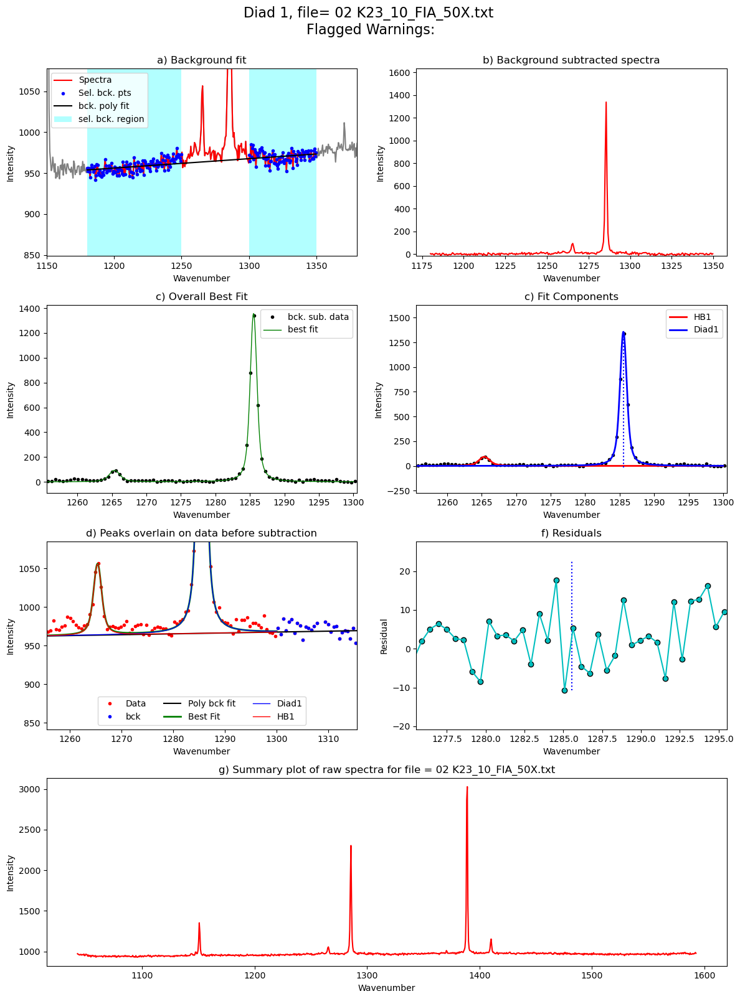

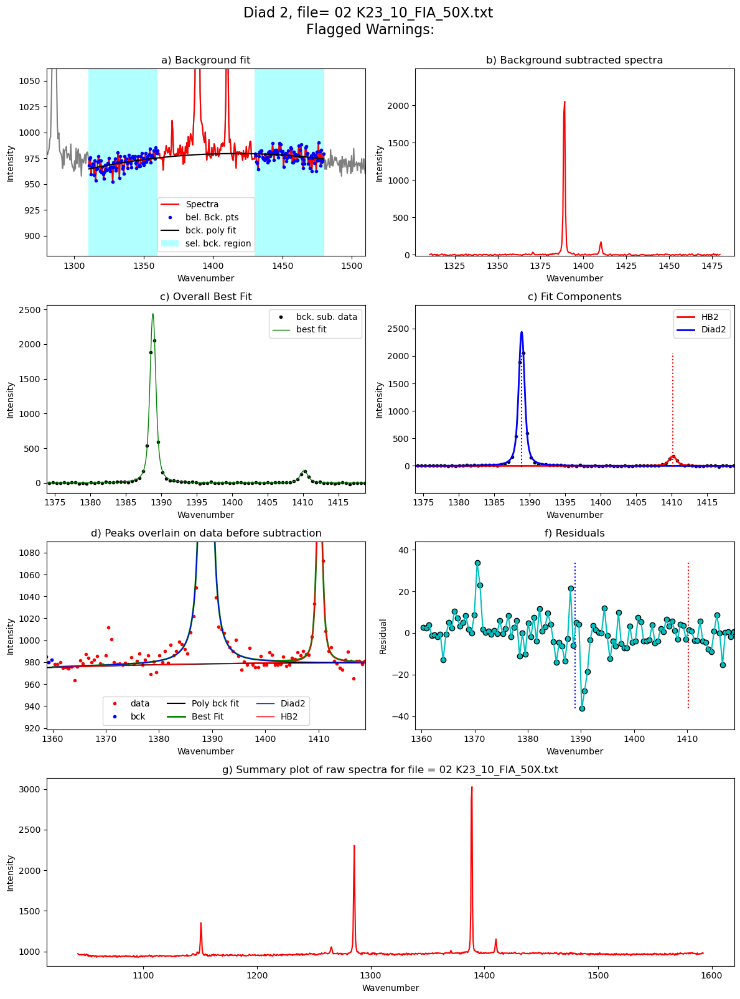

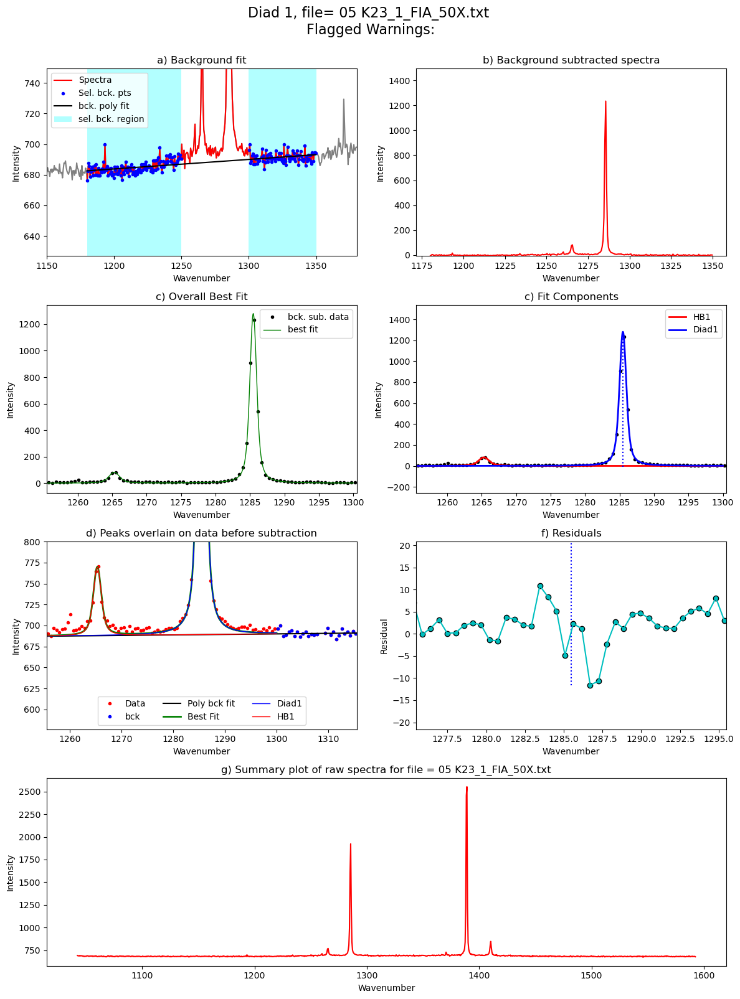

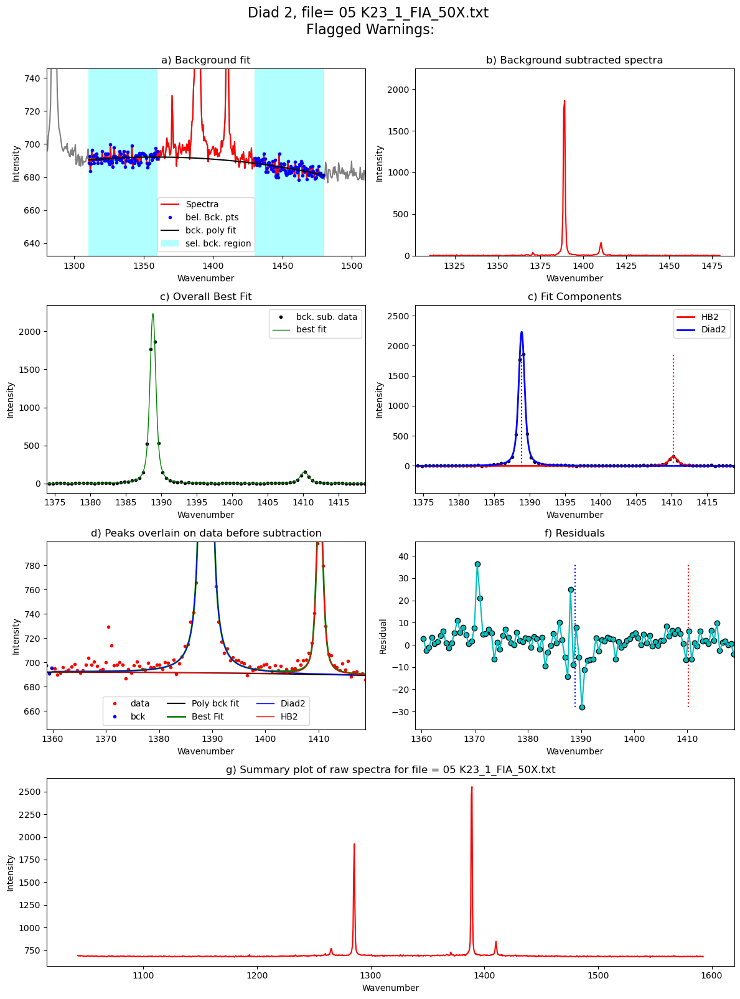

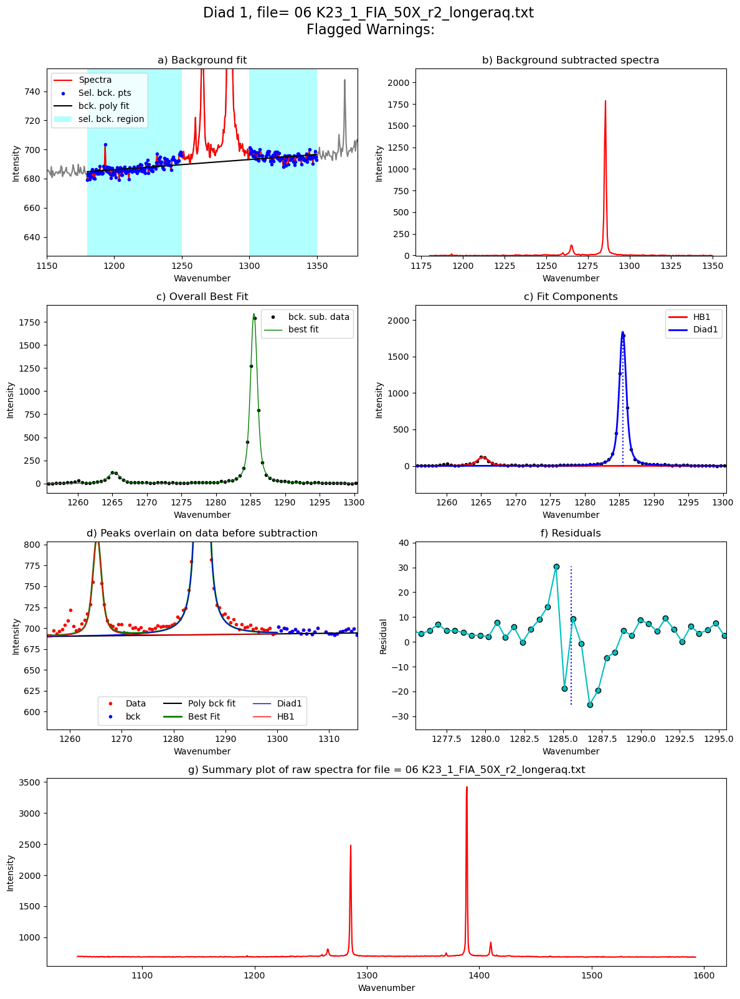

...

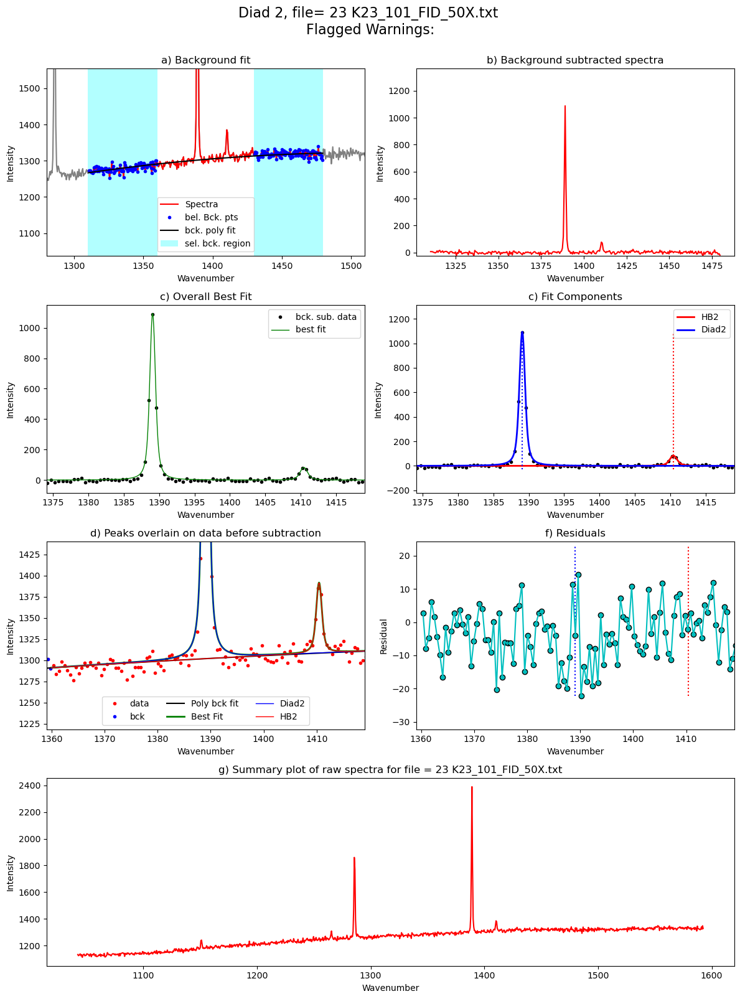

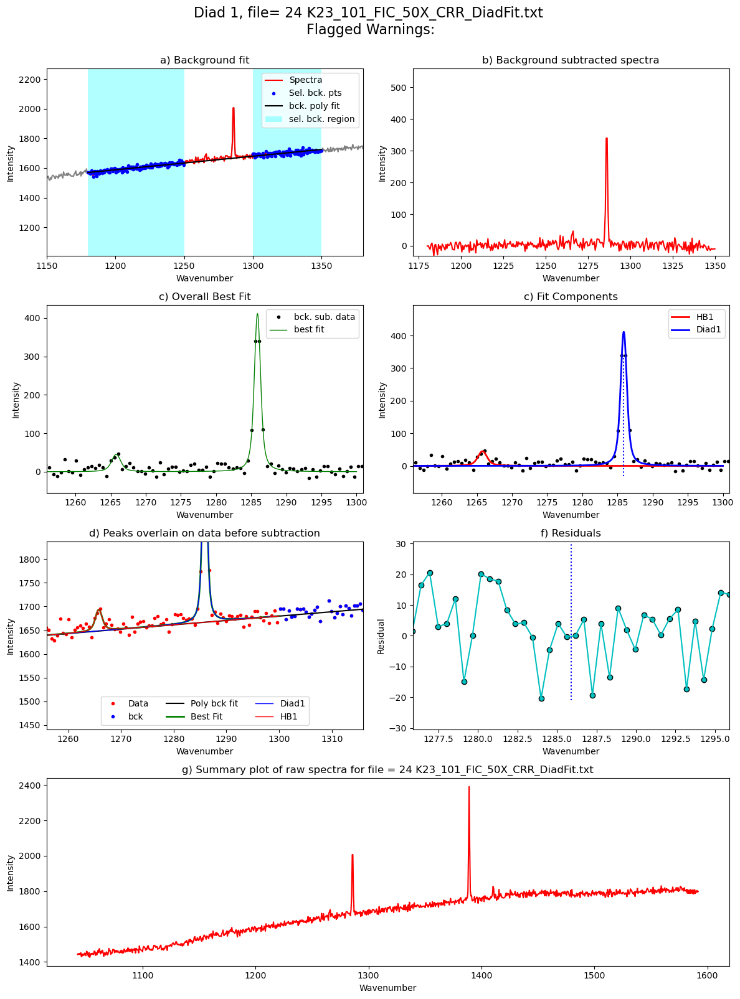

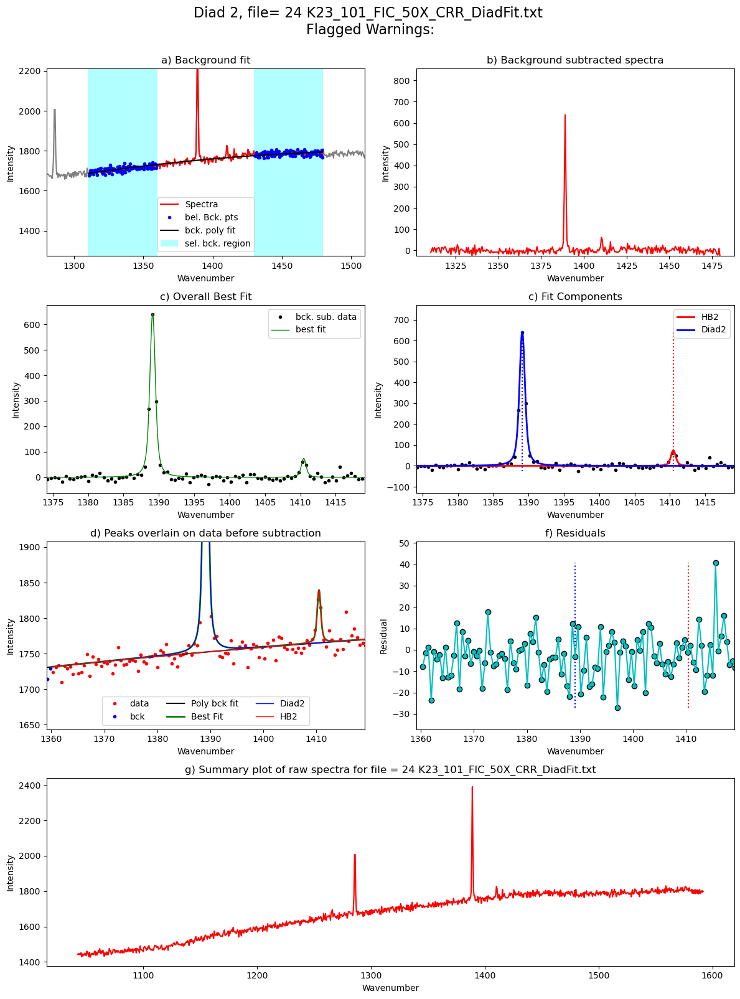

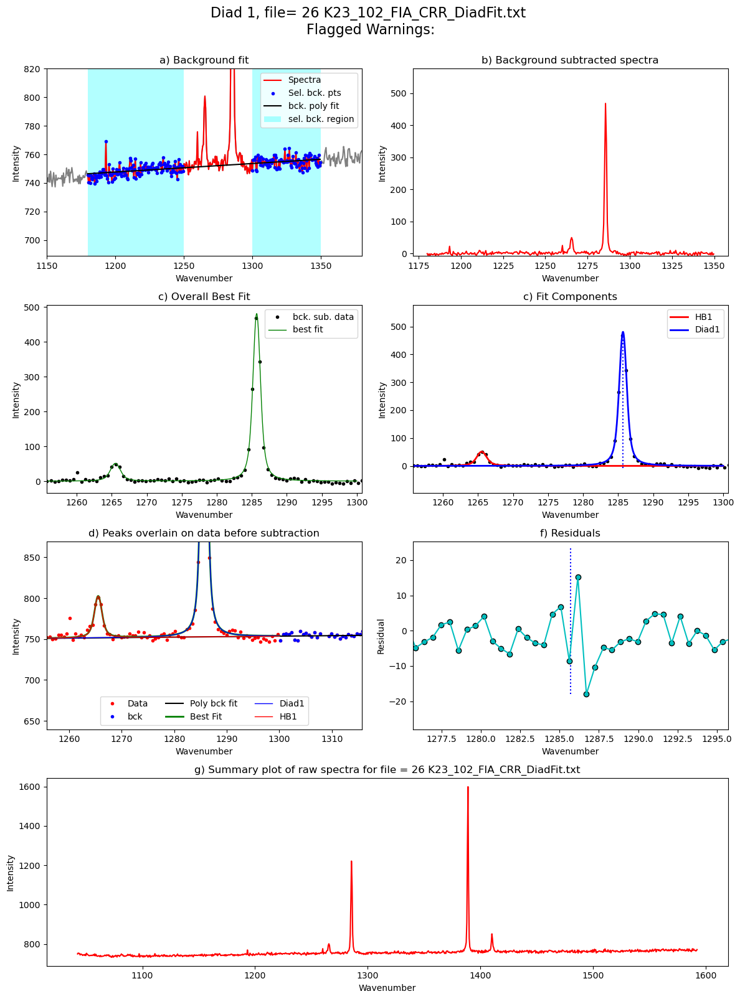

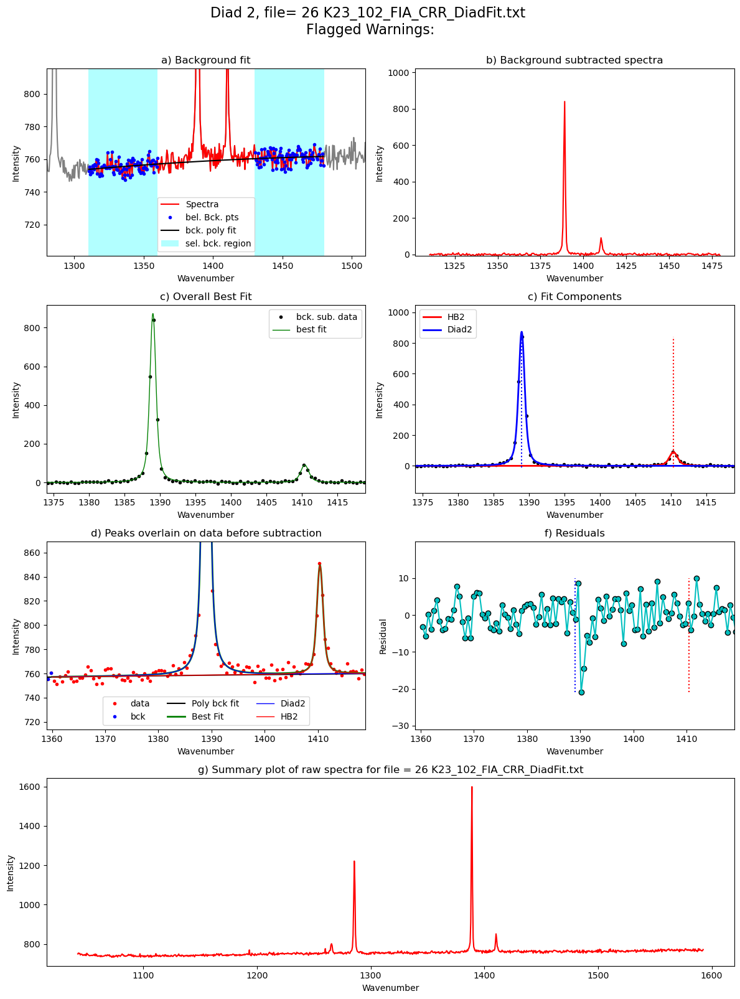

In [42]:
from tqdm import tqdm
plot_figure=True# If False, Means doesnt have to make figures, lot faster. 
close_figure=False # If True, wont show figures in notebook, but will still save them in a folder 
Diad_Files_i=Diad_Files
df_Merge = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files))): #
    tqdm.write(f"Processing file: {Diad_Files[i]}")
    
    
    # For diad1, config file like you had in the previous. 
    # Only really used to exclude a range (say your spectra has a known spec)
    diad_id_config=pf.diad_id_config(exclude_range1=[1308, 1309])
    
    # Here, the prominence are taken from the fitting in the last notebook
    diad1_fit_config2.HB_prom=GroupN_df['HB1_abs_prom'].iloc[i]
    diad1_fit_config2.diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i]
    diad1_fit_config2.gauss_amp=2*GroupN_df['HB1_abs_prom'].iloc[i]

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config2,
    config2=diad_id_config, path=spectra_path, filename=GroupN_df['filename'].iloc[i],
    filetype=filetype, plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
    HB_pos=GroupN_df['HB1_pos'].iloc[i])

    ## Same for diad2, just also has a C13 peak
    diad2_fit_config_init.HB_prom=GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i]
    diad2_fit_config_init.gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.C13_prom=GroupN_df['C13_abs_prom'].iloc[i]
    
    
    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
        config2=diad_id_config,
    path=spectra_path, filename=GroupN_df['filename'].iloc[i], 
    filetype=filetype,
    plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
    HB_pos=GroupN_df['HB2_pos'].iloc[i], 
    C13_pos=GroupN_df['C13_pos'].iloc[i])
    
    # This combines the outputs into a single dataframe
    data=pf.combine_diad_outputs(filename=GroupN_df['filename'].iloc[i], prefix=prefix, 
    Diad1_fit=Diad1_fit, path=spectra_path,                  
    Diad2_fit=Diad2_fit)        
    
 

    df_Merge = pd.concat([df_Merge, data], axis=0).reset_index(drop=True)


In [43]:
# Save parameters to excel
combo=df_Merge

if batch=='Weak':
    combo.to_excel('Weak_Diads_Voigt.xlsx', index=False)
if batch=='Medium':
    combo.to_excel('Medium_Diads_Voigt.xlsx', index=False)
if batch=='Strong':
    combo.to_excel('Strong_Diads_Voigt.xlsx', index=False)

In [46]:
combo['skew']

,filename,Splitting,Split_σ,Diad1_Combofit_Cent,Diad1_cent_err,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Residual,...,HB2_Sigma,C13_Cent,C13_Area,C13_Sigma,Diad2_Gauss_Cent,Diad2_Gauss_Area,Diad2_Gauss_Sigma,Diad1_Gauss_Cent,Diad1_Gauss_Area,Diad1_Gauss_Sigma
0,K23_10_FIA_50X,103.317600,0.003508,1285.533817,0.003203,1356.807979,1285.533867,2137.383008,0.328804,6.821308,...,0.366040,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,K23_1_FIA_50X,103.353434,0.002324,1285.487353,0.002039,1280.887604,1285.487403,2033.695706,0.331394,4.772273,...,0.413530,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,K23_1_FIA_50X_r2_longeraq,103.344393,0.001972,1285.498365,0.001713,1840.017326,1285.498415,2929.898204,0.332357,5.855229,...,0.421283,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,K23_2_FIA_50X,102.972374,0.025122,1286.386969,0.024404,54.833263,1286.386969,52.677647,0.200504,1.875107,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,K23_2_FIB_50X,103.162980,0.003646,1285.986682,0.002791,638.964841,1285.986732,788.400929,0.257528,2.742737,...,0.285343,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,K23_2_FIC_50X_CRR_DiadFit,103.177258,0.004663,1285.954363,0.003675,417.452142,1285.954413,540.349138,0.270163,2.238394,...,0.275740,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,K23_4_FIA_50X_CRR_DiadFit,103.103912,0.007663,1286.164442,0.007000,236.095619,1286.164442,287.193220,0.253880,2.351721,...,0.260474,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,K23_4_FIB_50X,103.315733,0.006640,1285.613998,0.006183,324.820790,1285.613998,497.687507,0.319782,2.606106,...,0.385803,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,K23_6_FIA_50X,103.329569,0.001656,1285.570622,0.001361,1946.305630,1285.570672,3048.585770,0.326934,4.521544,...,0.421109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,K23_7_FIA_50X,103.295547,0.001880,1285.609716,0.001553,1677.701126,1285.609766,2675.695715,0.332882,3.966258,...,0.406820,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### This plays a sound when the notebook is done if you have a tendency to procrastinate

In [45]:
# !pip install winotify

from winotify import Notification, audio

toast= Notification(app_id="VSCode",title="Notebook completed",
                    msg="Step3b_Secondary_Peaks is done!",
                    duration="short")
toast.set_audio(audio.Mail,loop=False)
toast.show()